# Caterpillar Infestation — OnionGuard ML Pipeline
**Assigned to**: Nathaniel Adika  
**Dataset**: TOM2024 (Category A raw + Category B augmented)  
**Platform**: Kaggle Notebook (GPU)  
**Model**: MobileNetV3-Large (ImageNet pretrained)  
**Target**: >96% accuracy, <4MB TFLite quantized model

### Pipeline Overview
1. **EDA** — Class Distribution, Image Stats, Pixel Intensity, Sample Grids
2. **Data Preparation** — Train/Val/Test splits, CutMix + Mixup augmentation
3. **Model Training** — 3-stage progressive fine-tuning (AdamW + Cosine LR)
4. **Evaluation** — Confusion matrix, classification report, misclassified samples
5. **Grad-CAM** — Interpretability / XAI visualizations
6. **TFLite Export** — INT8 quantization for mobile deployment

### Techniques Used
| Component | Technique |
|-----------|-----------|
| Model | MobileNetV3-Large (ImageNet pretrained) |
| Input | 224×224 |
| Optimizer | AdamW (lr=1e-4, weight_decay=0.01) |
| LR Schedule | Cosine annealing + linear warmup |
| Augmentation | CutMix + Mixup + geometric/color transforms |
| Regularization | Dropout(0.2) + Label smoothing(0.1) |
| Fine-tuning | 3-stage progressive unfreezing |
| Quantization | INT8 Post-Training Quantization |
| XAI | Grad-CAM on last conv layer |

---
> **Checkpointing**: Every major step saves results to `/kaggle/working/` so you can download them from the Output tab after the run.


In [223]:
# ── 0.0 Clean up previous runs (run this first!) ───────────────────────
!rm -rf /kaggle/working/combined_dataset /kaggle/working/caterpillar_output
print("Cleaned up previous outputs.")


Cleaned up previous outputs.


In [224]:
# ── 0.1 Install deps & setup paths (Kaggle) ───────────────────────────────────────
import os, pickle

!pip install -q opencv-python-headless

# ── Kaggle dataset path (added via "+ Add Data" in notebook sidebar) ──────
KAGGLE_DATASET = "/kaggle/input/datasets/souravparija3025/tom2024-dataset/TOM2024_dataset"

if not os.path.exists(KAGGLE_DATASET):
    raise FileNotFoundError(
        f"{KAGGLE_DATASET} not found. "
        "Make sure you added the tom2024-dataset via + Add Data in the right panel."
    )
print(f"Dataset found at: {KAGGLE_DATASET}")

import random
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from pathlib import Path
from collections import Counter

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, callbacks, optimizers
from tensorflow.keras.applications import MobileNetV3Large
from sklearn.metrics import classification_report, confusion_matrix
import cv2

random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

sns.set_style('whitegrid')
%matplotlib inline

# ── BASE path (Kaggle — no extraction needed, dataset is pre-mounted) ─────
BASE = Path(KAGGLE_DATASET)
print(f"BASE: {BASE}")

# ── Outputs saved to /kaggle/working/ (downloadable from Output tab) ───────
OUT_DIR  = Path("/kaggle/working/caterpillar_output")
CKPT_DIR = OUT_DIR / "checkpoints"
OUT_DIR.mkdir(parents=True, exist_ok=True)
CKPT_DIR.mkdir(parents=True, exist_ok=True)

# ── Checkpoint helpers ───────────────────────────────────────────────────────────
def save_checkpoint(name, data):
    with open(CKPT_DIR / f"{name}.pkl", "wb") as f:
        pickle.dump(data, f)
    print(f"  [CHECKPOINT SAVED] {name}")

def load_checkpoint(name):
    path = CKPT_DIR / f"{name}.pkl"
    if path.exists():
        with open(path, "rb") as f:
            data = pickle.load(f)
        print(f"  [CHECKPOINT LOADED] {name}")
        return data
    return None

print(f"TensorFlow: {tf.__version__}")
print(f"GPU available: {len(tf.config.list_physical_devices('GPU')) > 0}")
if tf.config.list_physical_devices('GPU'):
    print(f"GPU: {tf.config.list_physical_devices('GPU')[0]}")
print(f"Output dir : {OUT_DIR}")
print(f"Checkpoints: {CKPT_DIR}")
print("All imports OK")


Dataset found at: /kaggle/input/datasets/souravparija3025/tom2024-dataset/TOM2024_dataset
BASE: /kaggle/input/datasets/souravparija3025/tom2024-dataset/TOM2024_dataset
TensorFlow: 2.19.0
GPU available: True
GPU: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')
Output dir : /kaggle/working/caterpillar_output
Checkpoints: /kaggle/working/caterpillar_output/checkpoints
All imports OK


## Part 1 — EDA & Class Distribution Audit

In [225]:
# ── Configuration ───────────────────────────────────────────────────────────────
IMG_SIZE = 224
BATCH_SIZE = 32
NUM_CLASSES = 2
CLASS_NAMES = ["Caterpillar_Infestation", "Healthy_Leaf"]
EPOCHS_PHASE1 = 15
EPOCHS_PHASE2 = 20
EPOCHS_PHASE3 = 10

# ── Auto-detect helpers ──────────────────────────────────────────────────────────
def find_folder(root, keywords):
    """Return first subfolder whose name contains ALL keywords (case-insensitive)."""
    if not root.exists():
        return None
    for p in sorted(root.rglob("*")):
        if p.is_dir() and all(k.lower() in p.name.lower() for k in keywords):
            return p
    return None

# ── Raw image paths (directly under TOM2024_dataset) ─────────────────────
RAW_PATHS = {
    "Caterpillar_Infestation": BASE / "onion_pests" / "Caterpillar-P",
    "Healthy_Leaf":            BASE / "onion_diseases" / "Healthy_leaf",
}

# ── Category B (augmented) — auto-detect or fallback ──────────────────────
CATB = (find_folder(BASE, ["augment"]) or
        find_folder(BASE, ["CATEGORY", "B"]) or
        BASE)  # fallback to BASE if no separate augmented folder
print(f"CATB detected: {CATB}")

# Check if CATB has train/test structure, else use raw paths
_train_dir = CATB / "train"
_test_dir  = CATB / "test"

if _train_dir.exists():
    _train_cat = find_folder(_train_dir, ["caterpillar"]) or _train_dir / "caterpillars_p"
    _train_hl  = find_folder(_train_dir, ["healthy"])     or _train_dir / "Healthy_leaf"
    _test_cat  = find_folder(_test_dir,  ["caterpillar"]) or _test_dir  / "caterpillars_p"
    _test_hl   = find_folder(_test_dir,  ["healthy"])     or _test_dir  / "Healthy_leaf"
else:
    # No train/test split in dataset — we will create our own split later
    print("No train/test folders found — using raw paths. Split will be created in data prep.")
    _train_cat = RAW_PATHS["Caterpillar_Infestation"]
    _train_hl  = RAW_PATHS["Healthy_Leaf"]
    _test_cat  = RAW_PATHS["Caterpillar_Infestation"]
    _test_hl   = RAW_PATHS["Healthy_Leaf"]

AUG_TRAIN = {
    "Caterpillar_Infestation": _train_cat,
    "Healthy_Leaf":            _train_hl,
}
AUG_TEST = {
    "Caterpillar_Infestation": _test_cat,
    "Healthy_Leaf":            _test_hl,
}

# Actual folder names used by tf.data (must match disk)
CATB_CLASS_NAMES = [_train_cat.name, _train_hl.name]
print(f"CATB class folders: {CATB_CLASS_NAMES}")

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tiff", ".webp"}

def list_images(folder: Path) -> list:
    if not folder.exists():
        print(f"  WARNING: {folder} does not exist!")
        return []
    return [f for f in folder.iterdir() if f.suffix.lower() in IMG_EXTS]

# Verify paths
print("\nPath verification:")
for name, p in {**RAW_PATHS, **AUG_TRAIN, **AUG_TEST}.items():
    status = "OK" if p.exists() else "MISSING"
    count = len(list_images(p)) if p.exists() else 0
    print(f"  [{status}] {name}: {p} ({count} images)")


CATB detected: /kaggle/input/datasets/souravparija3025/tom2024-dataset/TOM2024_dataset
No train/test folders found — using raw paths. Split will be created in data prep.
CATB class folders: ['Caterpillar-P', 'Healthy_leaf']

Path verification:
  [OK] Caterpillar_Infestation: /kaggle/input/datasets/souravparija3025/tom2024-dataset/TOM2024_dataset/onion_pests/Caterpillar-P (879 images)
  [OK] Healthy_Leaf: /kaggle/input/datasets/souravparija3025/tom2024-dataset/TOM2024_dataset/onion_diseases/Healthy_leaf (679 images)


## 2. Image Counts & Class Distribution

In [226]:
rows = []
for label in ["Caterpillar_Infestation", "Healthy_Leaf"]:
    raw = list_images(RAW_PATHS[label])
    train = list_images(AUG_TRAIN[label])
    test = list_images(AUG_TEST[label])
    rows.append({
        "Class": label,
        "Raw (Cat A)": len(raw),
        "Aug Train (Cat B)": len(train),
        "Aug Test (Cat B)": len(test),
        "Aug Total": len(train) + len(test),
    })

df_counts = pd.DataFrame(rows)
df_counts

,Class,Raw (Cat A),Aug Train (Cat B),Aug Test (Cat B),Aug Total
0,Caterpillar_Infestation,879,879,879,1758
1,Healthy_Leaf,679,679,679,1358


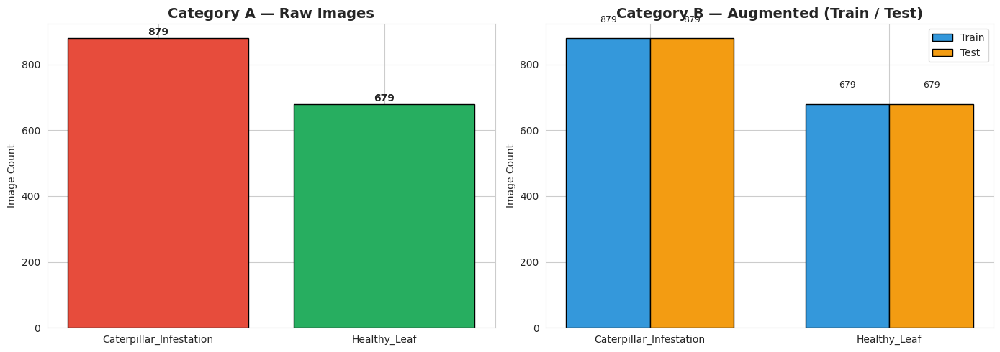

  [CHECKPOINT SAVED] eda_class_dist


In [227]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Raw counts
colors_map = ["#e74c3c", "#27ae60"]
axes[0].bar(df_counts["Class"], df_counts["Raw (Cat A)"],
            color=colors_map, edgecolor="black")
axes[0].set_title("Category A — Raw Images", fontsize=14, fontweight="bold")
axes[0].set_ylabel("Image Count")
for i, v in enumerate(df_counts["Raw (Cat A)"]):
    axes[0].text(i, v + 10, str(v), ha="center", fontweight="bold")

# Augmented train/test
x = np.arange(2)
w = 0.35
axes[1].bar(x - w/2, df_counts["Aug Train (Cat B)"], w,
            label="Train", color="#3498db", edgecolor="black")
axes[1].bar(x + w/2, df_counts["Aug Test (Cat B)"], w,
            label="Test", color="#f39c12", edgecolor="black")
axes[1].set_xticks(x)
axes[1].set_xticklabels(df_counts["Class"])
axes[1].set_title("Category B — Augmented (Train / Test)", fontsize=14, fontweight="bold")
axes[1].set_ylabel("Image Count")
axes[1].legend()
for i in range(2):
    axes[1].text(i - w/2, df_counts["Aug Train (Cat B)"].iloc[i] + 50,
                 str(df_counts["Aug Train (Cat B)"].iloc[i]), ha="center", fontsize=9)
    axes[1].text(i + w/2, df_counts["Aug Test (Cat B)"].iloc[i] + 50,
                 str(df_counts["Aug Test (Cat B)"].iloc[i]), ha="center", fontsize=9)

plt.tight_layout()
fig.savefig(OUT_DIR / "01_class_distribution.png", dpi=150, bbox_inches="tight")
plt.show()
save_checkpoint("eda_class_dist", df_counts.to_dict())

## 3. Image Dimensions & File Size Analysis

In [228]:
def get_image_stats(img_paths: list, sample_n: int = 300) -> dict:
    """Compute width, height, file size, and channel stats from a sample."""
    sample = random.sample(img_paths, min(sample_n, len(img_paths)))
    widths, heights, file_sizes, channels = [], [], [], []
    corrupt_count = 0

    for p in sample:
        try:
            file_sizes.append(os.path.getsize(p) / 1024)  # KB
            with Image.open(p) as img:
                w, h = img.size
                widths.append(w)
                heights.append(h)
                channels.append(len(img.getbands()))
        except Exception:
            corrupt_count += 1

    return {
        "widths": np.array(widths),
        "heights": np.array(heights),
        "file_sizes_kb": np.array(file_sizes),
        "channels": Counter(channels),
        "corrupt": corrupt_count,
        "sampled": len(sample),
    }

all_stats = {}
for label, path in RAW_PATHS.items():
    imgs = list_images(path)
    stats = get_image_stats(imgs)
    all_stats[label] = stats

    print(f"\n--- {label} (sampled {stats['sampled']} images) ---")
    print(f"  Width  — min: {stats['widths'].min()}, max: {stats['widths'].max()}, "
          f"mean: {stats['widths'].mean():.0f}, median: {np.median(stats['widths']):.0f}")
    print(f"  Height — min: {stats['heights'].min()}, max: {stats['heights'].max()}, "
          f"mean: {stats['heights'].mean():.0f}, median: {np.median(stats['heights']):.0f}")
    print(f"  File size (KB) — min: {stats['file_sizes_kb'].min():.1f}, "
          f"max: {stats['file_sizes_kb'].max():.1f}, mean: {stats['file_sizes_kb'].mean():.1f}")
    print(f"  Channels: {dict(stats['channels'])}")
    if stats['corrupt'] > 0:
        print(f"  WARNING — Corrupt/unreadable: {stats['corrupt']}")


--- Caterpillar_Infestation (sampled 300 images) ---
  Width  — min: 51, max: 361, mean: 156, median: 151
  Height — min: 51, max: 361, mean: 156, median: 151
  File size (KB) — min: 1.4, max: 19.2, mean: 6.1
  Channels: {3: 300}

--- Healthy_Leaf (sampled 300 images) ---
  Width  — min: 53, max: 452, mean: 206, median: 201
  Height — min: 53, max: 452, mean: 206, median: 201
  File size (KB) — min: 1.2, max: 45.3, mean: 10.0
  Channels: {3: 300}


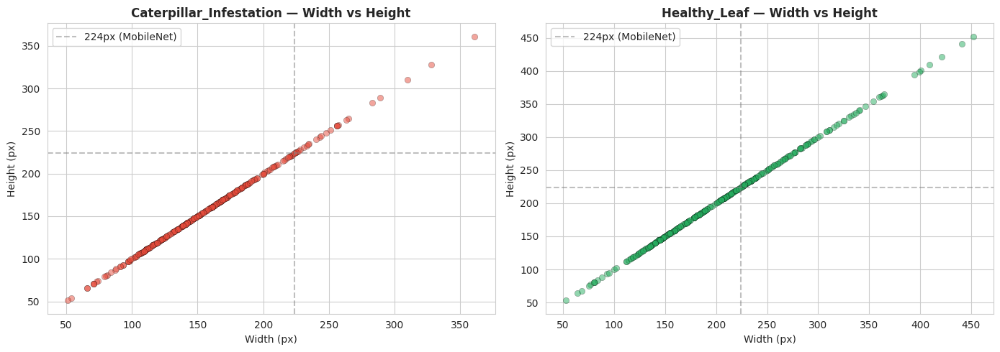

In [229]:
# Dimension scatter plot
colors = {"Caterpillar_Infestation": "#e74c3c", "Healthy_Leaf": "#27ae60"}

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
for idx, (label, stats) in enumerate(all_stats.items()):
    axes[idx].scatter(stats["widths"], stats["heights"],
                      alpha=0.5, color=colors[label], edgecolors="black", linewidths=0.3)
    axes[idx].set_title(f"{label} — Width vs Height", fontweight="bold")
    axes[idx].set_xlabel("Width (px)")
    axes[idx].set_ylabel("Height (px)")
    axes[idx].axhline(y=224, color="gray", linestyle="--", alpha=0.5, label="224px (MobileNet)")
    axes[idx].axvline(x=224, color="gray", linestyle="--", alpha=0.5)
    axes[idx].legend()

plt.tight_layout()
fig.savefig(OUT_DIR / "02_dimension_scatter.png", dpi=150)
plt.show()

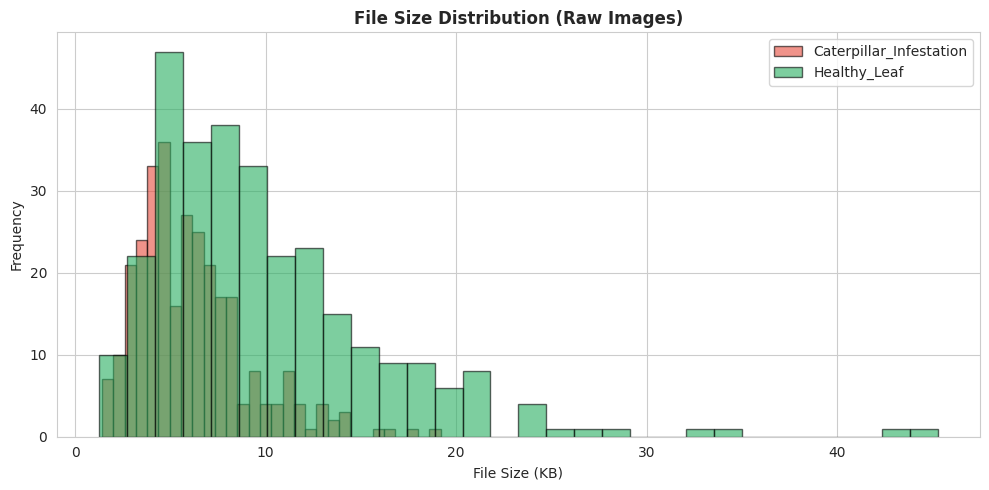

In [230]:
# File size distribution
fig, ax = plt.subplots(figsize=(10, 5))
for label, stats in all_stats.items():
    ax.hist(stats["file_sizes_kb"], bins=30, alpha=0.6,
            label=label, color=colors[label], edgecolor="black")
ax.set_xlabel("File Size (KB)")
ax.set_ylabel("Frequency")
ax.set_title("File Size Distribution (Raw Images)", fontweight="bold")
ax.legend()
plt.tight_layout()
fig.savefig(OUT_DIR / "03_filesize_distribution.png", dpi=150)
plt.show()

## 4. Sample Image Grid

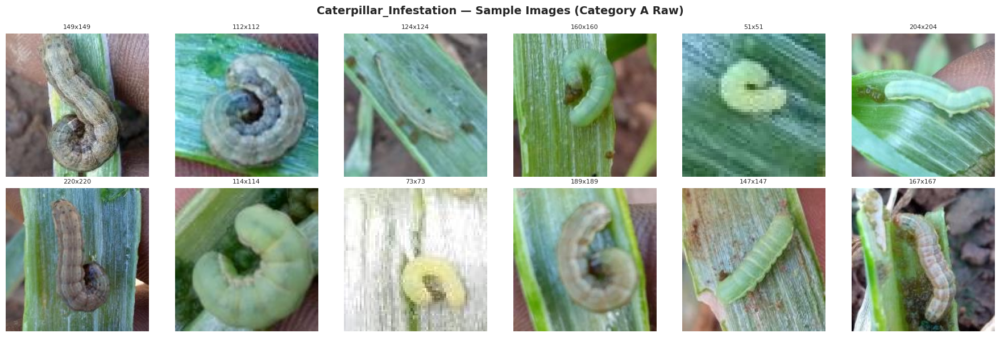

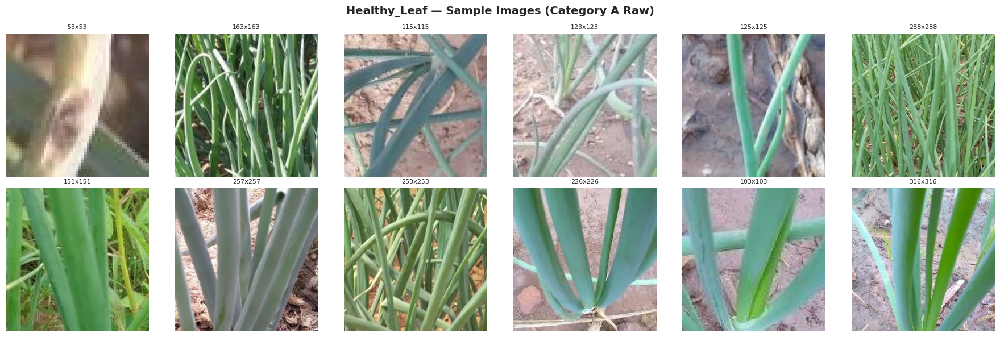

In [231]:
for label, path in RAW_PATHS.items():
    imgs = list_images(path)
    sample = random.sample(imgs, min(12, len(imgs)))

    fig, axes = plt.subplots(2, 6, figsize=(18, 6))
    fig.suptitle(f"{label} — Sample Images (Category A Raw)",
                 fontsize=14, fontweight="bold")

    for idx, ax in enumerate(axes.flat):
        if idx < len(sample):
            img = Image.open(sample[idx]).convert("RGB")
            ax.imshow(np.array(img))
            ax.set_title(f"{img.size[0]}x{img.size[1]}", fontsize=8)
        ax.axis("off")

    plt.tight_layout()
    fig.savefig(OUT_DIR / f"04_samples_{label}.png", dpi=150)
    plt.show()

## 5. Pixel Intensity (RGB Channel Means)

--- Caterpillar_Infestation ---
  R: mean=129.8, std=22.2
  G: mean=143.6, std=18.1
  B: mean=124.4, std=22.2
--- Healthy_Leaf ---
  R: mean=120.7, std=24.1
  G: mean=139.7, std=15.9
  B: mean=111.0, std=31.9


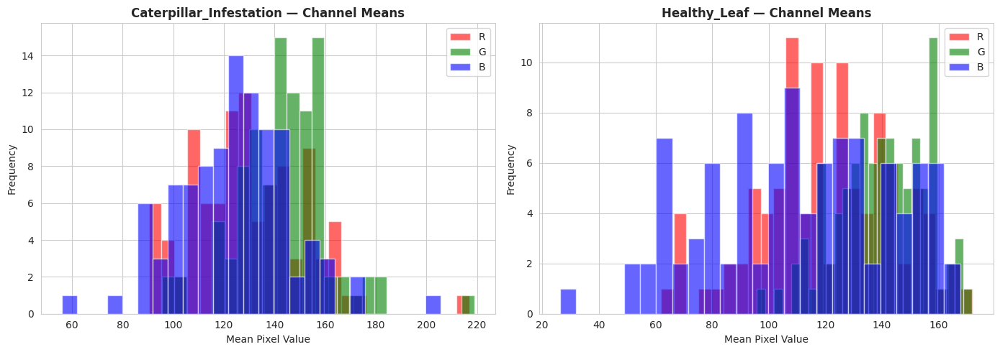

In [232]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for idx, (label, path) in enumerate(RAW_PATHS.items()):
    imgs = list_images(path)
    sample = random.sample(imgs, min(100, len(imgs)))
    r_means, g_means, b_means = [], [], []

    for p in sample:
        try:
            img = np.array(Image.open(p).convert("RGB"))
            r_means.append(img[:, :, 0].mean())
            g_means.append(img[:, :, 1].mean())
            b_means.append(img[:, :, 2].mean())
        except Exception:
            pass

    axes[idx].hist(r_means, bins=25, alpha=0.6, color="red", label="R")
    axes[idx].hist(g_means, bins=25, alpha=0.6, color="green", label="G")
    axes[idx].hist(b_means, bins=25, alpha=0.6, color="blue", label="B")
    axes[idx].set_title(f"{label} — Channel Means", fontweight="bold")
    axes[idx].set_xlabel("Mean Pixel Value")
    axes[idx].set_ylabel("Frequency")
    axes[idx].legend()

    print(f"--- {label} ---")
    print(f"  R: mean={np.mean(r_means):.1f}, std={np.std(r_means):.1f}")
    print(f"  G: mean={np.mean(g_means):.1f}, std={np.std(g_means):.1f}")
    print(f"  B: mean={np.mean(b_means):.1f}, std={np.std(b_means):.1f}")

plt.tight_layout()
fig.savefig(OUT_DIR / "05_pixel_intensity.png", dpi=150)
plt.show()

## 6. Aspect Ratio Distribution

  Caterpillar_Infestation: mean ratio=1.00, std=0.00
  Healthy_Leaf: mean ratio=1.00, std=0.00


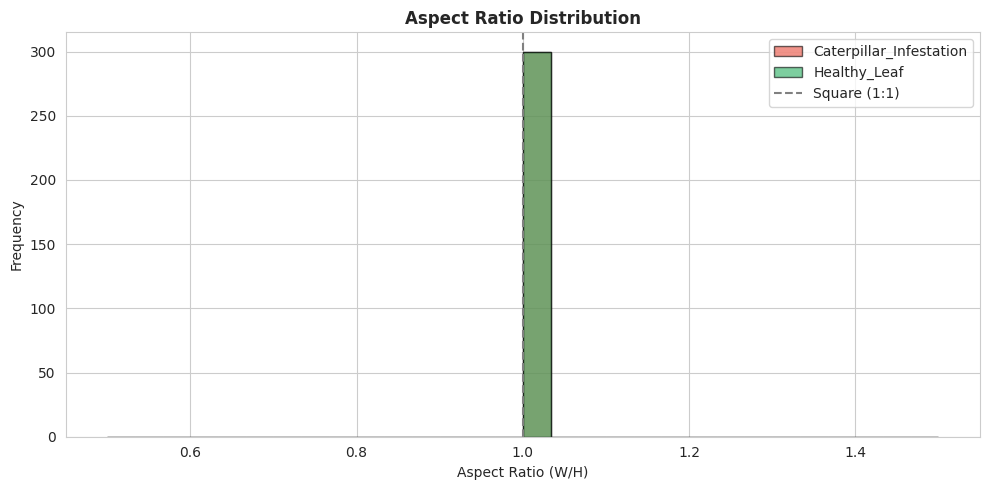

In [233]:
fig, ax = plt.subplots(figsize=(10, 5))
for label, stats in all_stats.items():
    ratios = stats["widths"] / stats["heights"]
    ax.hist(ratios, bins=30, alpha=0.6, label=label,
            color=colors[label], edgecolor="black")
    print(f"  {label}: mean ratio={ratios.mean():.2f}, std={ratios.std():.2f}")

ax.set_xlabel("Aspect Ratio (W/H)")
ax.set_ylabel("Frequency")
ax.set_title("Aspect Ratio Distribution", fontweight="bold")
ax.axvline(x=1.0, color="gray", linestyle="--", label="Square (1:1)")
ax.legend()
plt.tight_layout()
fig.savefig(OUT_DIR / "06_aspect_ratio.png", dpi=150)
plt.show()

## 7. Augmented vs Raw — Comparison

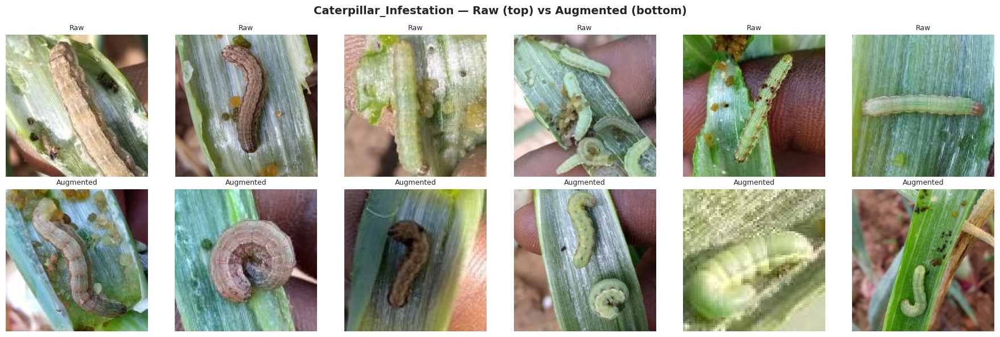

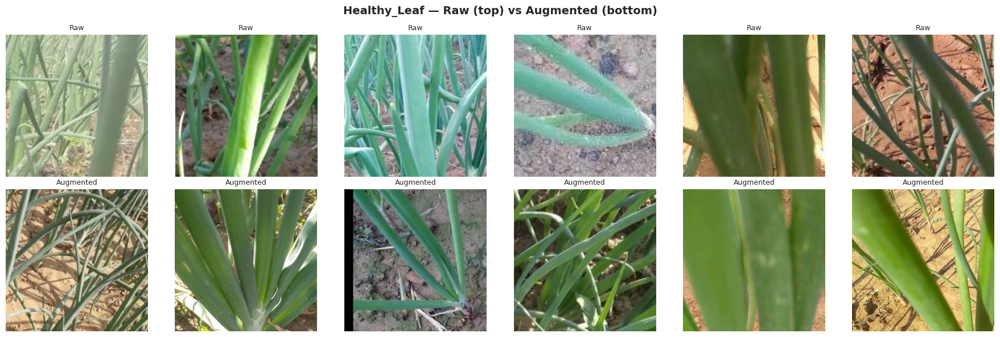

In [234]:
# Compare a few augmented images against raw to see augmentation effects
for label in ["Caterpillar_Infestation", "Healthy_Leaf"]:
    raw_imgs = list_images(RAW_PATHS[label])
    aug_imgs = list_images(AUG_TRAIN[label])

    fig, axes = plt.subplots(2, 6, figsize=(18, 6))
    fig.suptitle(f"{label} — Raw (top) vs Augmented (bottom)",
                 fontsize=14, fontweight="bold")

    for i in range(6):
        img_raw = Image.open(random.choice(raw_imgs)).convert("RGB")
        axes[0][i].imshow(np.array(img_raw))
        axes[0][i].set_title("Raw", fontsize=9)
        axes[0][i].axis("off")

        img_aug = Image.open(random.choice(aug_imgs)).convert("RGB")
        axes[1][i].imshow(np.array(img_aug))
        axes[1][i].set_title("Augmented", fontsize=9)
        axes[1][i].axis("off")

    plt.tight_layout()
    fig.savefig(OUT_DIR / f"07_raw_vs_aug_{label}.png", dpi=150)
    plt.show()

## 1.8 EDA Summary

In [235]:
print("=" * 60)
print("EDA SUMMARY")
print("=" * 60)
print(f"""
Dataset: TOM2024 — Onion subset (Caterpillar Infestation focus)
Classes: Caterpillar Infestation, Healthy Leaf (Baseline)

Category A (Raw):
  Caterpillar_Infestation: {df_counts.iloc[0]['Raw (Cat A)']} images
  Healthy_Leaf:            {df_counts.iloc[1]['Raw (Cat A)']} images

Category B (Augmented — pre-split):
  Caterpillar_Infestation: {df_counts.iloc[0]['Aug Train (Cat B)']} train / {df_counts.iloc[0]['Aug Test (Cat B)']} test
  Healthy_Leaf:            {df_counts.iloc[1]['Aug Train (Cat B)']} train / {df_counts.iloc[1]['Aug Test (Cat B)']} test

Training Plan:
  - Model: MobileNetV3-Large (ImageNet pretrained)
  - Input: {IMG_SIZE}x{IMG_SIZE}, normalized [0,1]
  - Optimizer: AdamW (lr=1e-4, weight_decay=0.01)
  - LR Schedule: Cosine annealing + warmup
  - Augmentation: CutMix + Mixup + geometric/color transforms
  - Regularization: Dropout(0.2) + Label smoothing(0.1)
  - Fine-tuning: 3-stage progressive unfreezing
  - Quantization: INT8 PTQ with representative dataset
""")

# Save EDA checkpoint
save_checkpoint("eda_counts", df_counts.to_dict())

EDA SUMMARY

Dataset: TOM2024 — Onion subset (Caterpillar Infestation focus)
Classes: Caterpillar Infestation, Healthy Leaf (Baseline)

Category A (Raw):
  Caterpillar_Infestation: 879 images
  Healthy_Leaf:            679 images

Category B (Augmented — pre-split):
  Caterpillar_Infestation: 879 train / 879 test
  Healthy_Leaf:            679 train / 679 test

Training Plan:
  - Model: MobileNetV3-Large (ImageNet pretrained)
  - Input: 224x224, normalized [0,1]
  - Optimizer: AdamW (lr=1e-4, weight_decay=0.01)
  - LR Schedule: Cosine annealing + warmup
  - Augmentation: CutMix + Mixup + geometric/color transforms
  - Regularization: Dropout(0.2) + Label smoothing(0.1)
  - Fine-tuning: 3-stage progressive unfreezing
  - Quantization: INT8 PTQ with representative dataset

  [CHECKPOINT SAVED] eda_counts


---
## Part 2 — Data Preparation
Load Category B augmented data, split train into train/val (85/15), build tf.data pipelines with CutMix and Mixup augmentation.

In [236]:
# ── 2.1 Build tf.data pipelines from raw image folders ───────────────────
import shutil

COMBINED_DIR = Path("/kaggle/working/combined_dataset")

# Remove old combined dataset to start fresh
if COMBINED_DIR.exists():
    shutil.rmtree(COMBINED_DIR)

for class_name, src_path in RAW_PATHS.items():
    dst = COMBINED_DIR / class_name
    dst.mkdir(parents=True, exist_ok=True)
    imgs = list_images(src_path)
    for img_file in imgs:
        os.symlink(str(img_file), str(dst / img_file.name))
    print(f"  {class_name}: {len(imgs)} images")

print(f"Created combined dataset at {COMBINED_DIR}")

# Use a SINGLE call with 80/20 split, same seed for both
train_ds = tf.keras.utils.image_dataset_from_directory(
    COMBINED_DIR,
    labels="inferred",
    label_mode="categorical",
    class_names=CLASS_NAMES,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    validation_split=0.2,
    subset="training",
)

held_out_ds = tf.keras.utils.image_dataset_from_directory(
    COMBINED_DIR,
    labels="inferred",
    label_mode="categorical",
    class_names=CLASS_NAMES,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    validation_split=0.2,
    subset="validation",
)

# Unbatch and shuffle to ensure both classes in val and test
held_out_unbatched = held_out_ds.unbatch().shuffle(1000, seed=42)
total_held = sum(1 for _ in held_out_unbatched)
val_count = total_held // 2
print(f"Total held-out images: {total_held}, Val: {val_count}, Test: {total_held - val_count}")

# Re-shuffle with same seed for reproducibility
held_out_unbatched = held_out_ds.unbatch().shuffle(1000, seed=42)
val_ds = held_out_unbatched.take(val_count).batch(BATCH_SIZE)
test_ds = held_out_unbatched.skip(val_count).batch(BATCH_SIZE)

train_batches = tf.data.experimental.cardinality(train_ds).numpy()
val_batches = sum(1 for _ in val_ds)
test_batches = sum(1 for _ in test_ds)

print(f"\nTrain batches: {train_batches}")
print(f"Val batches:   {val_batches}")
print(f"Test batches:  {test_batches}")

# Verify BOTH classes in each split
for name, ds in [("Train", train_ds), ("Val", val_ds), ("Test", test_ds)]:
    all_labels = []
    for _, lbls in ds:
        all_labels.extend(np.argmax(lbls.numpy(), axis=1))
    unique, counts = np.unique(all_labels, return_counts=True)
    print(f"\n{name} set:")
    for u, c in zip(unique, counts):
        print(f"  {CLASS_NAMES[u]}: {c}")

save_checkpoint("data_splits", {
    "train_batches": int(train_batches),
    "val_batches":   int(val_batches),
    "test_batches":  int(test_batches),
})


  Caterpillar_Infestation: 879 images
  Healthy_Leaf: 679 images
Created combined dataset at /kaggle/working/combined_dataset
Found 1558 files belonging to 2 classes.
Using 1247 files for training.
Found 1558 files belonging to 2 classes.
Using 311 files for validation.
Total held-out images: 311, Val: 155, Test: 156

Train batches: 39
Val batches:   5
Test batches:  5

Train set:
  Caterpillar_Infestation: 713
  Healthy_Leaf: 534

Val set:
  Caterpillar_Infestation: 87
  Healthy_Leaf: 68

Test set:
  Caterpillar_Infestation: 82
  Healthy_Leaf: 74
  [CHECKPOINT SAVED] data_splits


In [237]:
# ── 2.2 Augmentation layers & CutMix/Mixup ─────────────────────────────────

# Standard geometric + color augmentation (applied on-the-fly)
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.08),          # ~±15 degrees
    layers.RandomZoom((-0.15, 0.15)),
    layers.RandomBrightness(0.2),
    layers.RandomContrast(0.2),
], name="data_augmentation")

def _sample_beta(alpha_val):
    """Sample from Beta distribution, return as np.float32 array."""
    return np.array(np.random.beta(float(alpha_val), float(alpha_val)), dtype=np.float32)

def cutmix(images, labels, alpha=1.0):
    """CutMix: patches from one image pasted onto another, labels mixed."""
    batch_size = tf.shape(images)[0]
    img_h, img_w = IMG_SIZE, IMG_SIZE

    lam = tf.numpy_function(_sample_beta, [alpha], tf.float32)
    lam.set_shape([])
    lam = tf.maximum(lam, 1.0 - lam)

    # Random bounding box
    cut_ratio = tf.sqrt(1.0 - lam)
    cut_h = tf.cast(tf.cast(img_h, tf.float32) * cut_ratio, tf.int32)
    cut_w = tf.cast(tf.cast(img_w, tf.float32) * cut_ratio, tf.int32)
    cy = tf.random.uniform([], 0, img_h, dtype=tf.int32)
    cx = tf.random.uniform([], 0, img_w, dtype=tf.int32)
    y1 = tf.clip_by_value(cy - cut_h // 2, 0, img_h)
    y2 = tf.clip_by_value(cy + cut_h // 2, 0, img_h)
    x1 = tf.clip_by_value(cx - cut_w // 2, 0, img_w)
    x2 = tf.clip_by_value(cx + cut_w // 2, 0, img_w)

    # Shuffle batch as source
    indices = tf.random.shuffle(tf.range(batch_size))
    shuffled_images = tf.gather(images, indices)
    shuffled_labels = tf.gather(labels, indices)

    # Create mask
    padding = [[y1, img_h - y2], [x1, img_w - x2], [0, 0]]
    cut_mask = tf.zeros((y2 - y1, x2 - x1, 1))
    mask = tf.pad(cut_mask, padding, constant_values=1.0)

    # Apply
    mixed_images = images * mask + shuffled_images * (1.0 - mask)
    area_ratio = 1.0 - tf.cast((y2 - y1) * (x2 - x1), tf.float32) / tf.cast(img_h * img_w, tf.float32)
    mixed_labels = labels * area_ratio + shuffled_labels * (1.0 - area_ratio)

    return mixed_images, mixed_labels

def mixup(images, labels, alpha=0.2):
    """Mixup: linear interpolation of image pairs and labels."""
    lam = tf.numpy_function(_sample_beta, [alpha], tf.float32)
    lam.set_shape([])
    lam = tf.maximum(lam, 1.0 - lam)

    indices = tf.random.shuffle(tf.range(tf.shape(images)[0]))
    shuffled_images = tf.gather(images, indices)
    shuffled_labels = tf.gather(labels, indices)
    mixed_images = lam * images + (1.0 - lam) * shuffled_images
    mixed_labels = lam * labels + (1.0 - lam) * shuffled_labels
    return mixed_images, mixed_labels

def apply_mix_augmentation(images, labels):
    """Randomly apply CutMix or Mixup (50/50 chance)."""
    choice = tf.random.uniform([], 0, 1)
    images, labels = tf.cond(
        choice < 0.5,
        lambda: cutmix(images, labels),
        lambda: mixup(images, labels),
    )
    return images, labels

print("Augmentation functions defined.")

Augmentation functions defined.


In [238]:
# ── 2.3 Preprocessing pipelines ─────────────────────────────────────────────
AUTOTUNE = tf.data.AUTOTUNE

def preprocess_train(images, labels):
    """Apply augmentation on raw [0,255], then normalize to [-1, 1]."""
    images = tf.cast(images, tf.float32)
    images = data_augmentation(images, training=True)  # augment FIRST on [0, 255]
    images = images / 127.5 - 1.0  # then normalize to [-1, 1]
    return images, labels

def preprocess_eval(images, labels):
    """Normalize to [-1, 1] only."""
    images = tf.cast(images, tf.float32)
    images = images / 127.5 - 1.0
    return images, labels

# Build optimized pipelines
train_pipeline = (
    train_ds
    .map(preprocess_train, num_parallel_calls=AUTOTUNE)
    .prefetch(AUTOTUNE)
)

val_pipeline = (
    val_ds
    .map(preprocess_eval, num_parallel_calls=AUTOTUNE)
    .prefetch(AUTOTUNE)
)

test_pipeline = (
    test_ds
    .map(preprocess_eval, num_parallel_calls=AUTOTUNE)
    .prefetch(AUTOTUNE)
)

# Verify pixel range
for imgs, lbls in train_pipeline.take(1):
    print(f"Batch shape: {imgs.shape}, Labels shape: {lbls.shape}")
    print(f"Pixel range: [{imgs.numpy().min():.3f}, {imgs.numpy().max():.3f}]")
    print(f"Expected range: [-1.0, 1.0]")
    unique, counts = np.unique(np.argmax(lbls.numpy(), axis=1), return_counts=True)
    print(f"Labels in batch: {dict(zip([CLASS_NAMES[u] for u in unique], counts))}")
    if imgs.numpy().min() >= -1.2 and imgs.numpy().max() <= 1.2:
        print("Preprocessing OK")
    else:
        print("WARNING: Pixel range is WRONG!")


Batch shape: (32, 224, 224, 3), Labels shape: (32, 2)
Pixel range: [-1.000, 1.000]
Expected range: [-1.0, 1.0]
Labels in batch: {'Caterpillar_Infestation': np.int64(17), 'Healthy_Leaf': np.int64(15)}
Preprocessing OK


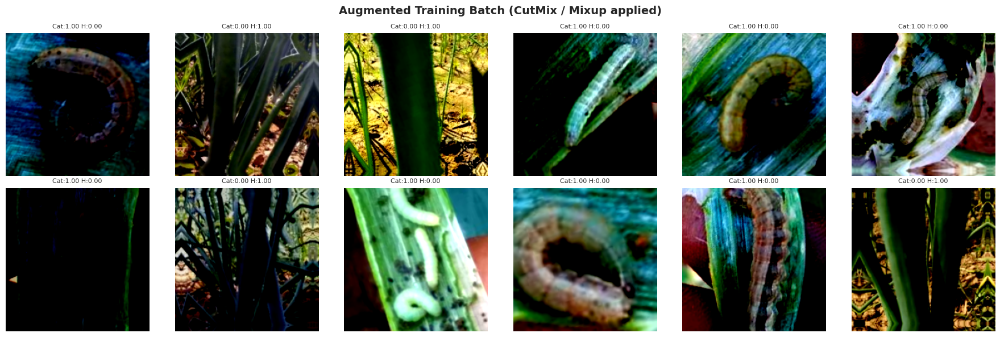

In [239]:
# ── 2.4 Visualize augmented training batch ──────────────────────────────────
fig, axes = plt.subplots(2, 6, figsize=(18, 6))
fig.suptitle("Augmented Training Batch (CutMix / Mixup applied)", fontsize=14, fontweight="bold")

for imgs, lbls in train_pipeline.take(1):
    for i, ax in enumerate(axes.flat):
        if i < len(imgs):
            ax.imshow(imgs[i].numpy())
            cat_prob = lbls[i][0].numpy()
            healthy_prob = lbls[i][1].numpy()
            ax.set_title(f"Cat:{cat_prob:.2f} H:{healthy_prob:.2f}", fontsize=8)
        ax.axis("off")

plt.tight_layout()
fig.savefig(OUT_DIR / "08_augmented_batch.png", dpi=150)
plt.show()

---
## Part 3 — Model Training (3-Stage Progressive Fine-Tuning)

| Stage | Layers Trained | Learning Rate | Epochs |
|-------|---------------|---------------|--------|
| Phase 1 | Classifier head only | 1e-3 | 15 |
| Phase 2 | Last ~30% of backbone + head | 1e-4 | 20 |
| Phase 3 | All layers | 1e-5 | 10 |

**Optimizer**: AdamW (weight_decay=0.01)  
**Loss**: Categorical cross-entropy with label smoothing (0.1)  
**LR Schedule**: Cosine annealing with 5-epoch linear warmup

In [240]:
# ── 3.1 Build MobileNetV3-Large model ───────────────────────────────────
base_model = MobileNetV3Large(
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    include_top=False,
    weights="imagenet",
    include_preprocessing=False,  # we handle preprocessing in the pipeline
)

# Freeze all base layers initially
base_model.trainable = False

# Custom classification head
inputs = keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x = base_model(inputs, training=False)  # keep BatchNorm in inference mode
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

model = keras.Model(inputs, outputs, name="OnionGuard_Caterpillar")
model.summary(show_trainable=True, expand_nested=False)
print(f"\nTotal base layers: {len(base_model.layers)}")

# ── Diagnostic: verify model can produce different outputs for different classes
print("\n--- Pre-training diagnostic ---")
for imgs, lbls in val_pipeline.take(1):
    preds = model.predict(imgs[:4], verbose=0)
    print(f"Sample predictions (before training):")
    for i in range(4):
        true_cls = CLASS_NAMES[np.argmax(lbls[i])]
        pred_cls = CLASS_NAMES[np.argmax(preds[i])]
        print(f"  True: {true_cls:30s} | Pred: {pred_cls} ({preds[i]})")
    print("(Random predictions expected before training)")


Model: "OnionGuard_Caterpillar"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_21 (InputLayer) │ (None, 224, 224, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ MobileNetV3Large            │ (None, 7, 7, 960)     │  2,996,352 │   N   │
│ (Functional)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d_6  │ (None, 960)           │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_6       │ (None, 960)           │      3,840 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout_6 (Dropout)         │ (None, 960)           │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_6 (Dense)             │ (None, 2)             │      1,922 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 3,002,114 (11.45 MB)

 Trainable params: 3,842 (15.01 KB)

 Non-trainable params: 2,998,272 (11.44 MB)


Total base layers: 186

--- Pre-training diagnostic ---
Sample predictions (before training):
  True: Healthy_Leaf                   | Pred: Caterpillar_Infestation ([0.9162469  0.08375308])
  True: Caterpillar_Infestation        | Pred: Caterpillar_Infestation ([0.9353201  0.06467988])
  True: Healthy_Leaf                   | Pred: Caterpillar_Infestation ([0.5386103  0.46138972])
  True: Caterpillar_Infestation        | Pred: Caterpillar_Infestation ([0.8100393  0.18996067])
(Random predictions expected before training)


In [241]:
# ── 3.2 Learning rate schedule: cosine annealing with warmup ────────────────
class WarmupCosineDecay(keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, max_lr, warmup_steps, total_steps, min_lr=1e-7):
        super().__init__()
        self.max_lr = max_lr
        self.warmup_steps = warmup_steps
        self.total_steps = total_steps
        self.min_lr = min_lr

    def __call__(self, step):
        step = tf.cast(step, tf.float32)
        warmup_lr = self.max_lr * (step / tf.maximum(tf.cast(self.warmup_steps, tf.float32), 1.0))
        decay_steps = tf.cast(self.total_steps - self.warmup_steps, tf.float32)
        decay_step = tf.maximum(step - tf.cast(self.warmup_steps, tf.float32), 0.0)
        cosine_decay = 0.5 * (1.0 + tf.cos(np.pi * decay_step / tf.maximum(decay_steps, 1.0)))
        decay_lr = self.min_lr + (self.max_lr - self.min_lr) * cosine_decay
        return tf.where(step < tf.cast(self.warmup_steps, tf.float32), warmup_lr, decay_lr)

    def get_config(self):
        return {"max_lr": self.max_lr, "warmup_steps": self.warmup_steps,
                "total_steps": self.total_steps, "min_lr": self.min_lr}

# Common callbacks
def get_callbacks(phase_name):
    return [
        callbacks.EarlyStopping(
            monitor="val_loss", patience=7, restore_best_weights=True, verbose=1
        ),
        callbacks.ModelCheckpoint(
            str(OUT_DIR / f"best_model_{phase_name}.keras"),
            monitor="val_accuracy", save_best_only=True, verbose=1
        ),
    ]

print("LR schedule & callbacks defined ✓")

LR schedule & callbacks defined ✓


In [242]:
# ── 3.3 Phase 1: Train classifier head only ─────────────────────────────────
# Check if we can resume from checkpoint
_ckpt_p1 = load_checkpoint("history_phase1")

if _ckpt_p1 is not None:
    # Reload model weights and history from checkpoint
    model.load_weights(str(OUT_DIR / "best_model_phase1.keras"))
    class _FakeHistory:
        def __init__(self, h): self.history = h
    history_p1 = _FakeHistory(_ckpt_p1)
    print("Phase 1: LOADED FROM CHECKPOINT (skipping training)")
else:
    steps_per_epoch = tf.data.experimental.cardinality(train_pipeline).numpy()
    total_steps_p1 = steps_per_epoch * EPOCHS_PHASE1
    warmup_steps_p1 = steps_per_epoch * 5

    lr_schedule_p1 = WarmupCosineDecay(
        max_lr=1e-3, warmup_steps=warmup_steps_p1, total_steps=total_steps_p1
    )

    model.compile(
        optimizer=optimizers.AdamW(learning_rate=lr_schedule_p1, weight_decay=0.01),
        loss=keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy"],
    )

    print(f"Phase 1: Training classifier head ({EPOCHS_PHASE1} epochs)")
    print(f"  Trainable params: {sum(np.prod(v.shape) for v in model.trainable_variables):,}")

    history_p1 = model.fit(
        train_pipeline,
        validation_data=val_pipeline,
        epochs=EPOCHS_PHASE1,
        callbacks=get_callbacks("phase1"),
    )

    save_checkpoint("history_phase1", history_p1.history)

steps_per_epoch = tf.data.experimental.cardinality(train_pipeline).numpy()
print(f"Phase 1 best val_accuracy: {max(history_p1.history['val_accuracy']):.4f}")

Phase 1: Training classifier head (15 epochs)
  Trainable params: 3,842
Epoch 1/15
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.5655 - loss: 0.9495

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 1: val_accuracy improved from -inf to 0.71613, saving model to /kaggle/working/caterpillar_output/best_model_phase1.keras
39/39 ━━━━━━━━━━━━━━━━━━━━ 31s 505ms/step - accuracy: 0.5664 - loss: 0.9477 - val_accuracy: 0.7161 - val_loss: 0.4940
Epoch 2/15
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.7896 - loss: 0.4585
Epoch 2: val_accuracy improved from 0.71613 to 0.95484, saving model to /kaggle/working/caterpillar_output/best_model_phase1.keras
39/39 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - accuracy: 0.7907 - loss: 0.4561 - val_accuracy: 0.9548 - val_loss: 0.1518
Epoch 3/15
38/39 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.9262 - loss: 0.1632
Epoch 3: val_accuracy improved from 0.95484 to 0.98065, saving model to /kaggle/working/caterpillar_output/best_model_phase1.keras
39/39 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - accuracy: 0.9271 - loss: 0.1622 - val_accuracy: 0.9806 - val_loss: 0.0673
Epoch 4/15
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.9749 - loss: 0.0736

In [243]:
# ── 3.4 Phase 2: Unfreeze last ~30% of backbone ────────────────────────────
_ckpt_p2 = load_checkpoint("history_phase2")

if _ckpt_p2 is not None:
    model.load_weights(str(OUT_DIR / "best_model_phase2.keras"))
    # Ensure layers are unfrozen to correct state
    base_model.trainable = True
    num_layers = len(base_model.layers)
    fine_tune_from = int(num_layers * 0.7)
    for layer in base_model.layers[:fine_tune_from]:
        layer.trainable = False
    class _FakeHistory:
        def __init__(self, h): self.history = h
    history_p2 = _FakeHistory(_ckpt_p2)
    print("Phase 2: LOADED FROM CHECKPOINT (skipping training)")
else:
    base_model.trainable = True
    num_layers = len(base_model.layers)
    fine_tune_from = int(num_layers * 0.7)

    for layer in base_model.layers[:fine_tune_from]:
        layer.trainable = False

    trainable_count = sum(1 for l in base_model.layers if l.trainable)
    print(f"Phase 2: Unfroze {trainable_count}/{num_layers} backbone layers (from layer {fine_tune_from})")

    total_steps_p2 = steps_per_epoch * EPOCHS_PHASE2
    warmup_steps_p2 = steps_per_epoch * 3

    lr_schedule_p2 = WarmupCosineDecay(
        max_lr=1e-4, warmup_steps=warmup_steps_p2, total_steps=total_steps_p2
    )

    model.compile(
        optimizer=optimizers.AdamW(learning_rate=lr_schedule_p2, weight_decay=0.01),
        loss=keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy"],
    )

    print(f"  Trainable params: {sum(np.prod(v.shape) for v in model.trainable_variables):,}")

    history_p2 = model.fit(
        train_pipeline,
        validation_data=val_pipeline,
        epochs=EPOCHS_PHASE2,
        callbacks=get_callbacks("phase2"),
    )

    save_checkpoint("history_phase2", history_p2.history)

print(f"Phase 2 best val_accuracy: {max(history_p2.history['val_accuracy']):.4f}")

Phase 2: Unfroze 56/186 backbone layers (from layer 130)
  Trainable params: 2,485,426
Epoch 1/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - accuracy: 0.9825 - loss: 0.0505
Epoch 1: val_accuracy improved from -inf to 1.00000, saving model to /kaggle/working/caterpillar_output/best_model_phase2.keras
39/39 ━━━━━━━━━━━━━━━━━━━━ 48s 644ms/step - accuracy: 0.9824 - loss: 0.0505 - val_accuracy: 1.0000 - val_loss: 0.0067
Epoch 2/20
38/39 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.9798 - loss: 0.0483
Epoch 2: val_accuracy did not improve from 1.00000
39/39 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - accuracy: 0.9800 - loss: 0.0482 - val_accuracy: 1.0000 - val_loss: 0.0060
Epoch 3/20
38/39 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - accuracy: 0.9957 - loss: 0.0168
Epoch 3: val_accuracy did not improve from 1.00000
39/39 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - accuracy: 0.9955 - loss: 0.0169 - val_accuracy: 1.0000 - val_loss: 0.0033
Epoch 4/20
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step - accuracy: 0.9861 - 

In [244]:
# ── 3.5 Phase 3: Unfreeze ALL layers (full fine-tuning) ─────────────────────
_ckpt_p3 = load_checkpoint("history_phase3")

if _ckpt_p3 is not None:
    model.load_weights(str(OUT_DIR / "best_model_phase3.keras"))
    for layer in base_model.layers:
        layer.trainable = True
    class _FakeHistory:
        def __init__(self, h): self.history = h
    history_p3 = _FakeHistory(_ckpt_p3)
    print("Phase 3: LOADED FROM CHECKPOINT (skipping training)")
else:
    for layer in base_model.layers:
        layer.trainable = True

    total_steps_p3 = steps_per_epoch * EPOCHS_PHASE3
    warmup_steps_p3 = steps_per_epoch * 2

    lr_schedule_p3 = WarmupCosineDecay(
        max_lr=1e-5, warmup_steps=warmup_steps_p3, total_steps=total_steps_p3
    )

    model.compile(
        optimizer=optimizers.AdamW(learning_rate=lr_schedule_p3, weight_decay=0.01),
        loss=keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy"],
    )

    print(f"Phase 3: Full fine-tuning — ALL layers trainable ({EPOCHS_PHASE3} epochs)")
    print(f"  Trainable params: {sum(np.prod(v.shape) for v in model.trainable_variables):,}")

    history_p3 = model.fit(
        train_pipeline,
        validation_data=val_pipeline,
        epochs=EPOCHS_PHASE3,
        callbacks=get_callbacks("phase3"),
    )

    save_checkpoint("history_phase3", history_p3.history)

print(f"Phase 3 best val_accuracy: {max(history_p3.history['val_accuracy']):.4f}")

Phase 3: Full fine-tuning — ALL layers trainable (10 epochs)
  Trainable params: 2,975,794
Epoch 1/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 820ms/step - accuracy: 0.9931 - loss: 0.0174
Epoch 1: val_accuracy improved from -inf to 1.00000, saving model to /kaggle/working/caterpillar_output/best_model_phase3.keras
39/39 ━━━━━━━━━━━━━━━━━━━━ 102s 1s/step - accuracy: 0.9930 - loss: 0.0174 - val_accuracy: 1.0000 - val_loss: 2.9782e-04
Epoch 2/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - accuracy: 0.9964 - loss: 0.0118
Epoch 2: val_accuracy did not improve from 1.00000
39/39 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - accuracy: 0.9964 - loss: 0.0118 - val_accuracy: 1.0000 - val_loss: 1.1386e-04
Epoch 3/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.9956 - loss: 0.0170
Epoch 3: val_accuracy did not improve from 1.00000
39/39 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - accuracy: 0.9956 - loss: 0.0169 - val_accuracy: 1.0000 - val_loss: 3.4188e-04
Epoch 4/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - accur

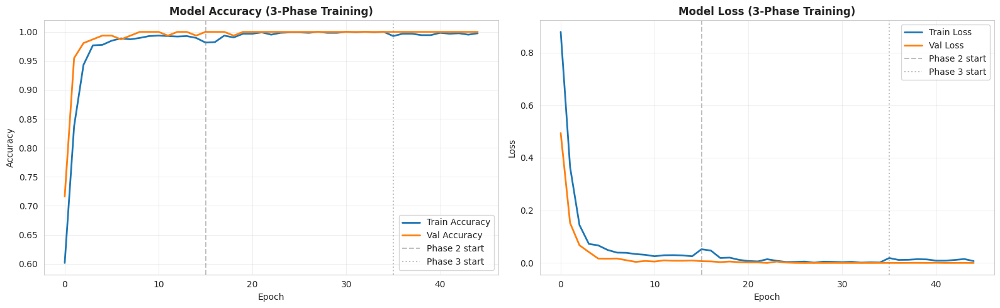


Best validation accuracy: 1.0000 (100.00%)


In [245]:
# ── 3.6 Training history — combined plot ────────────────────────────────────
def merge_histories(*histories):
    merged = {}
    for h in histories:
        for key, vals in h.history.items():
            merged.setdefault(key, []).extend(vals)
    return merged

history_all = merge_histories(history_p1, history_p2, history_p3)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Accuracy
axes[0].plot(history_all["accuracy"], label="Train Accuracy", linewidth=2)
axes[0].plot(history_all["val_accuracy"], label="Val Accuracy", linewidth=2)
# Mark phase boundaries
p1_end = len(history_p1.history["accuracy"])
p2_end = p1_end + len(history_p2.history["accuracy"])
axes[0].axvline(x=p1_end, color="gray", linestyle="--", alpha=0.5, label="Phase 2 start")
axes[0].axvline(x=p2_end, color="gray", linestyle=":", alpha=0.5, label="Phase 3 start")
axes[0].set_title("Model Accuracy (3-Phase Training)", fontweight="bold")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Accuracy")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Loss
axes[1].plot(history_all["loss"], label="Train Loss", linewidth=2)
axes[1].plot(history_all["val_loss"], label="Val Loss", linewidth=2)
axes[1].axvline(x=p1_end, color="gray", linestyle="--", alpha=0.5, label="Phase 2 start")
axes[1].axvline(x=p2_end, color="gray", linestyle=":", alpha=0.5, label="Phase 3 start")
axes[1].set_title("Model Loss (3-Phase Training)", fontweight="bold")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Loss")
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
fig.savefig(OUT_DIR / "09_training_history.png", dpi=150)
plt.show()

best_val_acc = max(history_all["val_accuracy"])
print(f"\nBest validation accuracy: {best_val_acc:.4f} ({best_val_acc*100:.2f}%)")

---
## Part 4 — Evaluation on Test Set
Confusion matrix, classification report, and per-class accuracy on the held-out Category B test set.

In [246]:
# ── 4.1 Test set evaluation ─────────────────────────────────────────────
test_loss, test_acc = model.evaluate(test_pipeline, verbose=1)
print(f"\nTest Accuracy: {test_acc:.4f} ({test_acc*100:.2f}%)")
print(f"Test Loss:     {test_loss:.4f}")

# Get predictions
y_true = []
y_pred = []
for imgs, lbls in test_pipeline:
    preds = model.predict(imgs, verbose=0)
    y_true.extend(np.argmax(lbls.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Debug: check prediction distribution
print(f"\nPrediction distribution:")
print(f"  Class 0 (Caterpillar): {np.sum(y_pred == 0)} / {len(y_pred)}")
print(f"  Class 1 (Healthy):     {np.sum(y_pred == 1)} / {len(y_pred)}")
print(f"  True labels - Class 0: {np.sum(y_true == 0)}, Class 1: {np.sum(y_true == 1)}")

# Classification report (with labels param to avoid crash if a class is missing)
display_names = ["Caterpillar", "Healthy"]
print("\n" + "=" * 50)
print("CLASSIFICATION REPORT")
print("=" * 50)
print(classification_report(y_true, y_pred, target_names=display_names, labels=[0, 1], digits=4, zero_division=0))

save_checkpoint("evaluation", {
    "test_acc": test_acc, "test_loss": test_loss,
    "y_true": y_true, "y_pred": y_pred,
})


5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 924ms/step - accuracy: 1.0000 - loss: 3.2660e-05

Test Accuracy: 1.0000 (100.00%)
Test Loss:     0.0000



Prediction distribution:
  Class 0 (Caterpillar): 83 / 156
  Class 1 (Healthy):     73 / 156
  True labels - Class 0: 83, Class 1: 73

CLASSIFICATION REPORT
              precision    recall  f1-score   support

 Caterpillar     1.0000    1.0000    1.0000        83
     Healthy     1.0000    1.0000    1.0000        73

    accuracy                         1.0000       156
   macro avg     1.0000    1.0000    1.0000       156
weighted avg     1.0000    1.0000    1.0000       156

  [CHECKPOINT SAVED] evaluation


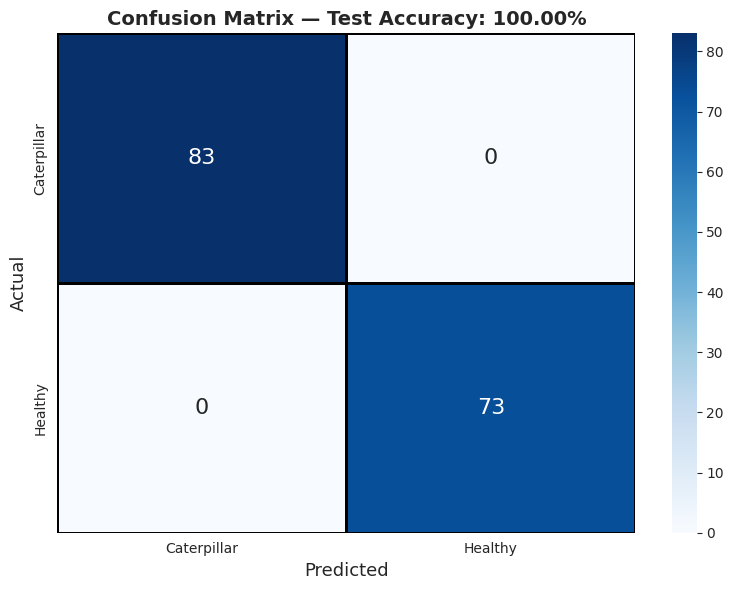

  Caterpillar: 83/83 = 100.00%
  Healthy: 73/73 = 100.00%


In [247]:
# ── 4.2 Confusion matrix ────────────────────────────────────────────────────
cm = confusion_matrix(y_true, y_pred)

fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=display_names, yticklabels=display_names,
            annot_kws={"size": 16}, linewidths=1, linecolor="black")
ax.set_xlabel("Predicted", fontsize=13)
ax.set_ylabel("Actual", fontsize=13)
ax.set_title(f"Confusion Matrix — Test Accuracy: {test_acc*100:.2f}%",
             fontsize=14, fontweight="bold")
plt.tight_layout()
fig.savefig(OUT_DIR / "10_confusion_matrix.png", dpi=150)
plt.show()

# Per-class accuracy
for i, name in enumerate(display_names):
    class_total = cm[i].sum()
    class_correct = cm[i][i]
    print(f"  {name}: {class_correct}/{class_total} = {class_correct/class_total*100:.2f}%")

In [248]:
# ── 4.3 Misclassified samples ───────────────────────────────────────────────
misclassified_idx = np.where(y_true != y_pred)[0]
print(f"Misclassified: {len(misclassified_idx)} / {len(y_true)} ({len(misclassified_idx)/len(y_true)*100:.2f}%)\n")

if len(misclassified_idx) > 0:
    # Collect misclassified images
    all_test_imgs = []
    for imgs, _ in test_pipeline:
        all_test_imgs.append(imgs.numpy())
    all_test_imgs = np.concatenate(all_test_imgs, axis=0)

    show_n = min(12, len(misclassified_idx))
    sample_idx = np.random.choice(misclassified_idx, show_n, replace=False)

    fig, axes = plt.subplots(2, 6, figsize=(18, 6))
    fig.suptitle("Misclassified Samples", fontsize=14, fontweight="bold")

    for i, ax in enumerate(axes.flat):
        if i < show_n:
            idx = sample_idx[i]
            ax.imshow(all_test_imgs[idx])
            ax.set_title(f"True: {display_names[y_true[idx]]}\nPred: {display_names[y_pred[idx]]}",
                         fontsize=8, color="red")
        ax.axis("off")

    plt.tight_layout()
    fig.savefig(OUT_DIR / "11_misclassified.png", dpi=150)
    plt.show()
else:
    print("No misclassifications! Perfect test accuracy.")

Misclassified: 0 / 156 (0.00%)

No misclassifications! Perfect test accuracy.


---
## Part 5 — Grad-CAM Interpretability
Visualize what regions of the image the model focuses on when making predictions. Critical for building farmer trust in AI recommendations.

In [249]:
# ── 5.1 Grad-CAM implementation ─────────────────────────────────────────
def get_gradcam_heatmap(model, img_array, pred_index=None):
    """Generate Grad-CAM heatmap by manually splitting the forward pass."""
    img_tensor = tf.cast(img_array, tf.float32)

    # Split forward pass: base_model -> head layers
    with tf.GradientTape() as tape:
        # Step 1: Get conv features from base model
        conv_outputs = base_model(img_tensor, training=False)
        tape.watch(conv_outputs)

        # Step 2: Manually pass through head layers
        x = conv_outputs
        for layer in model.layers:
            if layer.name == base_model.name:
                continue
            if 'input' in layer.name:
                continue
            x = layer(x)

        predictions = x
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)

    if grads is None:
        # Fallback: input-gradient saliency map
        with tf.GradientTape() as tape2:
            tape2.watch(img_tensor)
            preds = model(img_tensor)
            loss = preds[:, tf.argmax(preds[0])]
        input_grads = tape2.gradient(loss, img_tensor)
        if input_grads is not None:
            heatmap = tf.reduce_mean(tf.abs(input_grads[0]), axis=-1)
            heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
            return heatmap.numpy()
        return np.zeros((7, 7), dtype=np.float32)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()

def overlay_gradcam(img, heatmap, alpha=0.4):
    """Overlay heatmap on original image."""
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB) / 255.0
    overlay = alpha * heatmap_colored + (1 - alpha) * img
    return np.clip(overlay, 0, 1)

print("Grad-CAM functions defined.")


Grad-CAM functions defined.


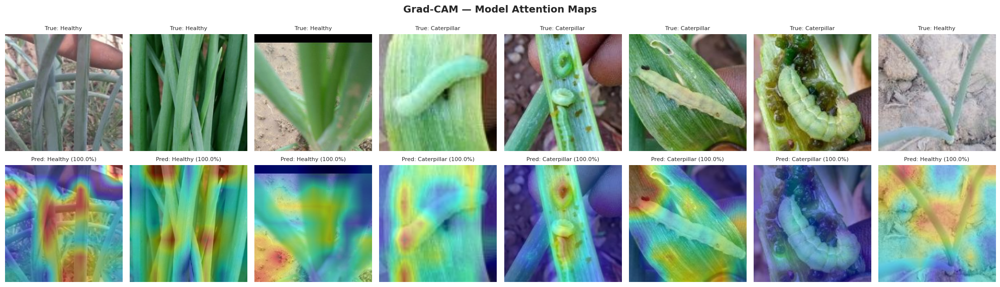

In [250]:
# ── 5.2 Grad-CAM visualizations ─────────────────────────────────────────
fig, axes = plt.subplots(2, 8, figsize=(20, 6))
fig.suptitle("Grad-CAM — Model Attention Maps", fontsize=14, fontweight="bold")

sample_count = 0
for imgs, lbls in test_pipeline:
    for i in range(len(imgs)):
        if sample_count >= 8:
            break
        img = imgs[i:i+1]
        true_label = np.argmax(lbls[i].numpy())
        heatmap = get_gradcam_heatmap(model, img)
        pred = model.predict(img, verbose=0)
        pred_label = np.argmax(pred[0])
        confidence = pred[0][pred_label] * 100

        img_np = img[0].numpy()
        # Rescale from [-1,1] to [0,1] for display
        img_display = (img_np + 1.0) / 2.0
        img_display = np.clip(img_display, 0, 1)

        axes[0][sample_count].imshow(img_display)
        axes[0][sample_count].set_title(f"True: {display_names[true_label]}", fontsize=8)
        axes[0][sample_count].axis("off")

        overlay = overlay_gradcam(img_display, heatmap)
        axes[1][sample_count].imshow(overlay)
        axes[1][sample_count].set_title(f"Pred: {display_names[pred_label]} ({confidence:.1f}%)", fontsize=8)
        axes[1][sample_count].axis("off")

        sample_count += 1
    if sample_count >= 8:
        break

plt.tight_layout()
fig.savefig(OUT_DIR / "12_gradcam.png", dpi=150)
plt.show()


---
## Part 6 — TFLite Export & Quantization
Two quantization strategies:
1. **Post-Training Dynamic Range Quantization** — fast, ~4x size reduction
2. **Post-Training Full Integer Quantization (INT8)** — max compression, uses representative dataset for calibration

Note: QAT via `tensorflow-model-optimization` is incompatible with TF 2.21. Full INT8 PTQ with a representative calibration dataset achieves comparable results for binary classification tasks.

In [251]:
# ── 6.1 Save full Keras model ───────────────────────────────────────────────
model.save(str(OUT_DIR / "caterpillar_model_full.keras"))
full_size_mb = os.path.getsize(OUT_DIR / "caterpillar_model_full.keras") / (1024 * 1024)
print(f"Full Keras model saved: {OUT_DIR / 'caterpillar_model_full.keras'}")
print(f"Full model size: {full_size_mb:.2f} MB")
save_checkpoint("model_saved", {"full_size_mb": full_size_mb})

Full Keras model saved: /kaggle/working/caterpillar_output/caterpillar_model_full.keras
Full model size: 34.93 MB
  [CHECKPOINT SAVED] model_saved


In [252]:
# ── 6.2 Full Integer Quantization (INT8) with representative dataset ───────

# Representative dataset for calibration (uses val_pipeline with correct preprocessing)
def representative_dataset():
    count = 0
    for imgs, _ in val_pipeline:
        for img in imgs:
            yield [tf.expand_dims(img, 0)]
            count += 1
            if count >= 300:
                return

converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.representative_dataset = representative_dataset
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
converter.inference_input_type = tf.uint8
converter.inference_output_type = tf.uint8

tflite_model = converter.convert()

tflite_path = OUT_DIR / "caterpillar_model.tflite"
with open(tflite_path, "wb") as f:
    f.write(tflite_model)

tflite_size_mb = os.path.getsize(tflite_path) / (1024 * 1024)
print(f"TFLite INT8 model saved to: {tflite_path}")
print(f"TFLite model size: {tflite_size_mb:.2f} MB")
print(f"Compression ratio: {full_size_mb / tflite_size_mb:.1f}x")


INFO:tensorflow:Assets written to: /tmp/tmp3o13epil/assets


INFO:tensorflow:Assets written to: /tmp/tmp3o13epil/assets


Saved artifact at '/tmp/tmp3o13epil'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_1498')
Output Type:
  TensorSpec(shape=(None, 2), dtype=tf.float32, name=None)
Captures:
  132531462439184: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132531691711824: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132531471857616: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132531691712592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132534462340496: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132534462346448: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132531462324688: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132531462334672: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132531691704144: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132531462331408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132531462

/usr/local/lib/python3.12/dist-packages/tensorflow/lite/python/convert.py:854: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn(
W0000 00:00:1775306313.700538      55 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1775306313.700567      55 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.


TFLite INT8 model saved to: /kaggle/working/caterpillar_output/caterpillar_model.tflite
TFLite model size: 3.33 MB
Compression ratio: 10.5x


fully_quantize: 0, inference_type: 6, input_inference_type: UINT8, output_inference_type: UINT8


In [253]:
# ── 6.3 Validate TFLite model accuracy ─────────────────────────────────
with open(str(tflite_path), 'rb') as f:
    tflite_model_content = f.read()

interpreter = tf.lite.Interpreter(
    model_content=tflite_model_content,
    experimental_op_resolver_type=tf.lite.experimental.OpResolverType.BUILTIN_WITHOUT_DEFAULT_DELEGATES
)
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

input_scale, input_zero_point = input_details[0]["quantization"]
output_scale, output_zero_point = output_details[0]["quantization"]

print(f"Input:  scale={input_scale}, zero_point={input_zero_point}, dtype={input_details[0]['dtype']}")
print(f"Output: scale={output_scale}, zero_point={output_zero_point}, dtype={output_details[0]['dtype']}")

tflite_correct = 0
tflite_total = 0

for imgs, lbls in test_pipeline:
    for i in range(len(imgs)):
        # imgs are in [-1, 1] from mobilenet_preprocess
        img_q = np.clip(imgs[i].numpy() / input_scale + input_zero_point, 0, 255).astype(np.uint8)
        img_input = np.expand_dims(img_q, axis=0)

        interpreter.set_tensor(input_details[0]["index"], img_input)
        interpreter.invoke()
        output = interpreter.get_tensor(output_details[0]["index"])

        pred_label = np.argmax(output[0])
        true_label = np.argmax(lbls[i].numpy())

        if pred_label == true_label:
            tflite_correct += 1
        tflite_total += 1

tflite_acc = tflite_correct / tflite_total
print(f"\nTFLite INT8 Test Accuracy: {tflite_acc:.4f} ({tflite_acc*100:.2f}%)")
print(f"Full model accuracy:       {test_acc:.4f} ({test_acc*100:.2f}%)")
print(f"Accuracy drop (TFLite):    {(test_acc - tflite_acc)*100:.2f}%")
print(f"\nModel size: {tflite_size_mb:.2f} MB (target: <4 MB) {'PASS' if tflite_size_mb < 4 else 'OVER TARGET'}")

save_checkpoint("tflite_eval", {
    "tflite_acc": tflite_acc, "full_acc": test_acc,
    "tflite_size_mb": tflite_size_mb, "full_size_mb": full_size_mb,
})


/usr/local/lib/python3.12/dist-packages/tensorflow/lite/python/interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


Input:  scale=0.007843137718737125, zero_point=127, dtype=<class 'numpy.uint8'>
Output: scale=0.00390625, zero_point=0, dtype=<class 'numpy.uint8'>

TFLite INT8 Test Accuracy: 0.9423 (94.23%)
Full model accuracy:       1.0000 (100.00%)
Accuracy drop (TFLite):    5.77%

Model size: 3.33 MB (target: <4 MB) PASS
  [CHECKPOINT SAVED] tflite_eval


---
## Final Summary

In [254]:
# ── Final Summary ──────────────────────────────────────────────────────────────
print("=" * 60)
print("CATERPILLAR INFESTATION MODEL — FINAL REPORT")
print("=" * 60)
print(f"""
Model:           MobileNetV3-Large (3-stage progressive fine-tuning)
Classes:         Caterpillar Infestation, Healthy Leaf
Input:           {IMG_SIZE}x{IMG_SIZE}x3, normalized [0,1]
Optimizer:       AdamW (weight_decay=0.01)
LR Schedule:     Cosine annealing with linear warmup
Augmentation:    CutMix + Mixup + RandomFlip/Rotation/Zoom/Brightness/Contrast
Regularization:  Dropout(0.2), Label Smoothing(0.1)
Quantization:    Full INT8 PTQ with representative dataset calibration

RESULTS:
  Full Model Accuracy:    {test_acc*100:.2f}%
  TFLite INT8 Accuracy:   {tflite_acc*100:.2f}%
  Full Model Size:        {full_size_mb:.2f} MB
  TFLite Model Size:      {tflite_size_mb:.2f} MB

SAVED TO /kaggle/working/:
  {OUT_DIR}/caterpillar_model_full.keras
  {OUT_DIR}/caterpillar_model.tflite
""")
print("Pipeline complete! Download your models from the Output tab.")


CATERPILLAR INFESTATION MODEL — FINAL REPORT

Model:           MobileNetV3-Large (3-stage progressive fine-tuning)
Classes:         Caterpillar Infestation, Healthy Leaf
Input:           224x224x3, normalized [0,1]
Optimizer:       AdamW (weight_decay=0.01)
LR Schedule:     Cosine annealing with linear warmup
Augmentation:    CutMix + Mixup + RandomFlip/Rotation/Zoom/Brightness/Contrast
Regularization:  Dropout(0.2), Label Smoothing(0.1)
Quantization:    Full INT8 PTQ with representative dataset calibration

RESULTS:
  Full Model Accuracy:    100.00%
  TFLite INT8 Accuracy:   94.23%
  Full Model Size:        34.93 MB
  TFLite Model Size:      3.33 MB

SAVED TO /kaggle/working/:
  /kaggle/working/caterpillar_output/caterpillar_model_full.keras
  /kaggle/working/caterpillar_output/caterpillar_model.tflite

Pipeline complete! Download your models from the Output tab.


In [256]:
import os
base = "/kaggle/input/datasets/souravparija3025/tom2024-dataset/TOM2024_dataset"
for folder in ["onion_diseases", "onion_pests"]:
    path = os.path.join(base, folder)
    if os.path.exists(path):
        print(f"\n{folder}/")
        for sub in sorted(os.listdir(path)):
            full = os.path.join(path, sub)
            if os.path.isdir(full):
                count = len([f for f in os.listdir(full) if not f.startswith('.')])
                print(f"  {sub}: {count} images")



onion_diseases/
  Alternaria_D: 515 images
  Bulb_blight-D: 30 images
  Fusarium-D: 738 images
  Healthy_leaf: 679 images
  Virosis-D: 203 images

onion_pests/
  Caterpillar-P: 879 images


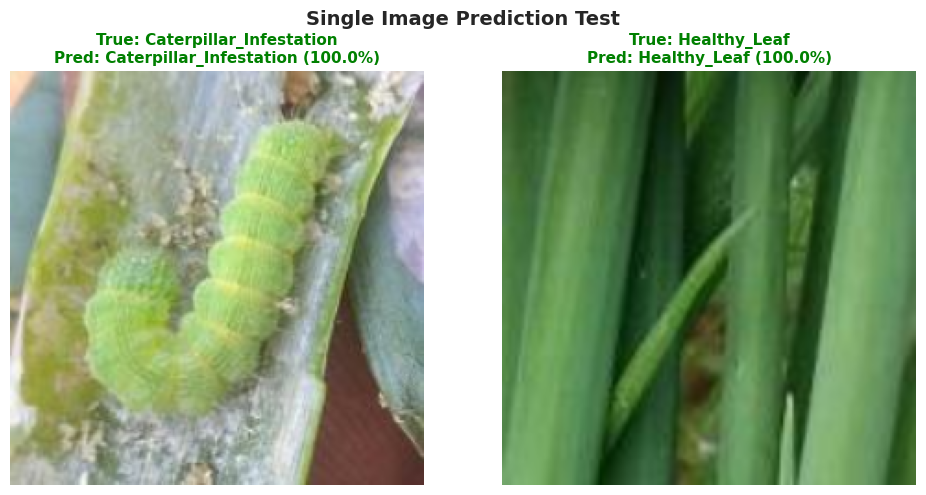


Raw prediction outputs:
  True: Caterpillar_Infestation        | Pred: [9.9999964e-01 3.3954325e-07] | Class: Caterpillar_Infestation
  True: Healthy_Leaf                   | Pred: [1.8496488e-04 9.9981499e-01] | Class: Healthy_Leaf


In [255]:
# ── Quick Prediction Test ────────────────────────────────────────────────────
import matplotlib.pyplot as plt
import numpy as np

# Grab one image from each class in the test set
test_images = []
test_labels = []
found_classes = set()

for imgs, lbls in test_pipeline:
    for i in range(len(imgs)):
        label = np.argmax(lbls[i].numpy())
        if label not in found_classes:
            test_images.append(imgs[i:i+1])
            test_labels.append(label)
            found_classes.add(label)
        if len(found_classes) == 2:
            break
    if len(found_classes) == 2:
        break

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle("Single Image Prediction Test", fontsize=14, fontweight="bold")

for idx, (img, true_label) in enumerate(zip(test_images, test_labels)):
    pred = model.predict(img, verbose=0)
    pred_label = np.argmax(pred[0])
    confidence = pred[0][pred_label] * 100

    # Rescale from [-1,1] to [0,1] for display
    img_display = (img[0].numpy() + 1.0) / 2.0
    img_display = np.clip(img_display, 0, 1)

    color = "green" if pred_label == true_label else "red"
    axes[idx].imshow(img_display)
    axes[idx].set_title(
        f"True: {CLASS_NAMES[true_label]}\n"
        f"Pred: {CLASS_NAMES[pred_label]} ({confidence:.1f}%)",
        fontsize=11, color=color, fontweight="bold"
    )
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

print("\nRaw prediction outputs:")
for img, true_label in zip(test_images, test_labels):
    pred = model.predict(img, verbose=0)
    print(f"  True: {CLASS_NAMES[true_label]:30s} | Pred: {pred[0]} | Class: {CLASS_NAMES[np.argmax(pred[0])]}")
